## Import Library

In [1]:
import torch
import torchvision.datasets  as dsets
import torch.utils.data
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torchvision.utils as vutils

import tqdm
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display, FileLink

import numpy as np
import imageio
from PIL import Image
import torch

## Parameter

In [2]:
batch_size = 32
image_size = 64
num_epochs = 20

# Ensure all operations are done on the CPU
torch.device("cpu")

device(type='cpu')

## Data Transformation and Definition

In [3]:
import os
from torch.utils.data import Dataset, DataLoader

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = self._load_images()

    def _load_images(self):
        image_paths = []
        # Check if root directory exists
        if not os.path.exists(self.root_dir):
            raise FileNotFoundError(f"The directory {self.root_dir} does not exist.")
        
        print(f"Checking directory: {self.root_dir}")
        
        for img_file in os.listdir(self.root_dir):
            img_path = os.path.join(self.root_dir, img_file)
            if img_file.lower().endswith('.jpg'):
                image_paths.append(img_path)
            else:
                print(f"Skipping non-JPG file: {img_path}")
        
        if not image_paths:
            raise ValueError(f"No JPG images found in the directory {self.root_dir}.")

        print(f"Found {len(image_paths)} images.")
        return image_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")
        label = 0  # Since there are no classes, we assign a single label
        if self.transform:
            image = self.transform(image)
        return image, label


transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
])

dataset = CustomImageDataset(root_dir="images3", transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, drop_last=True, shuffle=True)

for images, labels in dataloader:
    print(f"Batch of images shape: {images.shape}")
    print(f"Batch of labels: {labels}")
    break


Checking directory: images3
Found 2295 images.
Batch of images shape: torch.Size([32, 3, 64, 64])
Batch of labels: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])


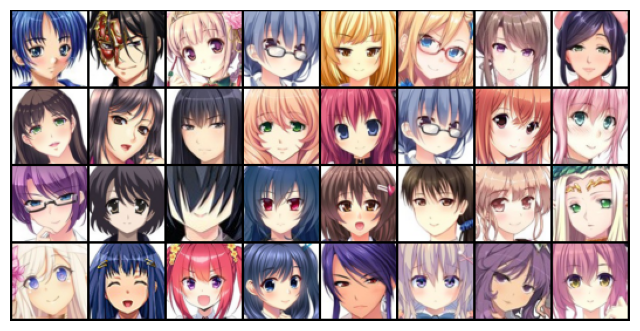

In [4]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0], padding=2).cpu(),(1,2,0)))

## Preprocessing and Postprocessing Model VAE

In [5]:
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)

class UnFlatten(nn.Module):
    def forward(self, input, size=1024):
        return input.view(input.size(0), size, 1, 1)

## VAE Model

In [6]:
class VAE(nn.Module):
    def __init__(self, image_channels=3, h_dim=1024, z_dim=32):
        super().__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2),
            nn.ReLU(),
            Flatten()
        )
        
        self.h2mu = nn.Linear(h_dim, z_dim)
        self.h2sigma = nn.Linear(h_dim, z_dim)
        self.z2h = nn.Linear(z_dim, h_dim)
        
        self.decoder = nn.Sequential(
            UnFlatten(),
            nn.ConvTranspose2d(h_dim, 128, kernel_size=5, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=6, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=6, stride=2),
            nn.Sigmoid(),
        )
        
    def reparameterize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.randn(*mu.size())
        z = mu + std * eps
        return z
    
    def bottleneck(self, h):
        mu = self.h2mu(h)
        logvar = self.h2sigma(h)
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar
        
    def encode(self, x):
        return self.bottleneck(self.encoder(x))[0]

    def decode(self, z):
        return self.decoder(self.z2h(z))
    
    def forward(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        z = self.z2h(z)
        return self.decoder(z), mu, logvar

In [7]:
def vae_loss(recon_x, x, mu, logvar) -> float:
    BCE = F.binary_cross_entropy(recon_x.view(-1, image_size*image_size*3),
                                 x.view(-1, image_size*image_size*3), reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE + KLD

In [8]:
model = VAE()
try:
    model.load_state_dict(torch.load('vae.pth'))
except:
    print("Weights not found ):")
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

## Training

In [9]:
for epoch in range(num_epochs):
    train_loss = 0
    for data, _ in tqdm.tqdm(dataloader):
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = vae_loss(recon_batch, data, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()
        
    torch.save(model.state_dict(), "vae.pth")
    print('epoch %d, loss %.4f' % (epoch, train_loss / len(dataset)))
model.eval()
FileLink(r'vae.pth')

100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:33<00:00,  2.13it/s]


epoch 0, loss 6548.3548


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:31<00:00,  2.25it/s]


epoch 1, loss 6406.4449


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:32<00:00,  2.22it/s]


epoch 2, loss 6392.1029


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:29<00:00,  2.38it/s]


epoch 3, loss 6387.9061


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.36it/s]


epoch 4, loss 6376.9804


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:29<00:00,  2.38it/s]


epoch 5, loss 6366.8166


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:29<00:00,  2.40it/s]


epoch 6, loss 6364.5250


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.36it/s]


epoch 7, loss 6357.8071


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:29<00:00,  2.38it/s]


epoch 8, loss 6348.2170


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.37it/s]


epoch 9, loss 6349.2280


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:28<00:00,  2.46it/s]


epoch 10, loss 6335.3751


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.34it/s]


epoch 11, loss 6333.5280


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.32it/s]


epoch 12, loss 6329.5819


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.35it/s]


epoch 13, loss 6315.5994


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:29<00:00,  2.37it/s]


epoch 14, loss 6311.5898


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.35it/s]


epoch 15, loss 6307.3455


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.36it/s]


epoch 16, loss 6306.7250


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:29<00:00,  2.38it/s]


epoch 17, loss 6304.3996


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.36it/s]


epoch 18, loss 6298.8655


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [00:30<00:00,  2.36it/s]

epoch 19, loss 6290.9838


C:\Users\MINAN\Downloads\GANS\vae.pth

## Visualization

In [10]:
def get(x):
    return dataset[x][0].view(1, 3, image_size, image_size)

def imshow(img):
    pic = np.transpose(img.numpy(), (1,2,0))
    plt.axis('off')
    return plt.imshow(pic, animated=True)

def morph(inputs, steps: int, delay: int):
    latent = [model.encode(get(k)).data for k in inputs]
    fig = plt.figure()
    images = []
    for a, b in zip(latent, latent[1:] + [latent[0]]):
        for t in np.linspace(0, 1, steps):
            c = a*(1-t)+b*t
            morphed = model.decode(c).data[0]
            images.append([imshow(morphed)])
    
    ani = animation.ArtistAnimation(fig, images, interval=delay)

    display(HTML(ani.to_html5_video()))

In [11]:
def morph(indices, steps, delay, output_file):
    images = []
    
    for idx in range(len(indices) - 1):
        start_img = dataset[indices[idx]][0].numpy().transpose(1, 2, 0)
        end_img = dataset[indices[idx + 1]][0].numpy().transpose(1, 2, 0)
        for step in range(steps):
            alpha = step / float(steps)
            morphed = (1 - alpha) * start_img + alpha * end_img
            morphed = np.clip(morphed, 0, 1)
            images.append((morphed * 255).astype(np.uint8))  

    imageio.mimsave(output_file, images, fps=1000/delay)

num_images = 50  
num_steps = 40   
delay = 30
output_file = "morph_animation.gif"  

indices = np.random.randint(0, len(dataset), num_images)
morph(indices, num_steps, delay, output_file)


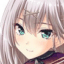

In [12]:
from IPython.display import Image

# Tampilkan GIF
Image(filename='morph_animation.gif')

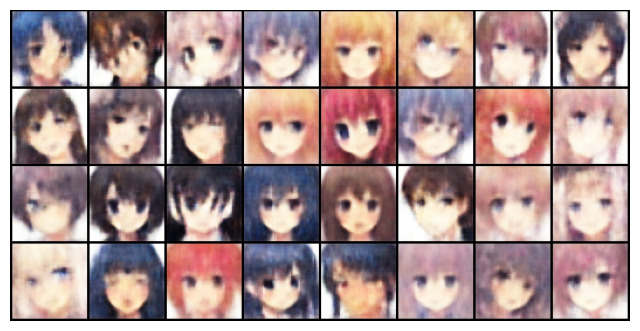

In [13]:
decoded_batch = model.decode(model.encode(real_batch[0]).data).data
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(decoded_batch, padding=2).cpu(),(1,2,0)))

In [14]:
from PIL import Image

decoded_batch = model.decode(model.encode(real_batch[0]).data).data
decoded_np = np.transpose(vutils.make_grid(decoded_batch, padding=2).cpu().numpy(), (1, 2, 0))
image = Image.fromarray((decoded_np * 255).astype(np.uint8))
image.save("decoded_image.png")